# Overview

This week's curriculum focuses in figuring out (and visualizing) what's special about a certain text (or collection of texts). We'll also learn about community detection in networks (that's how we'll get our groups of text)

* Tricks for raw text (NLPP, Chapter 3).
* Community Detection and info-boxes 
* Identifying important words in a document (TF-IDF)

In the first part, we will take a quick tour of NLPP1e's chapter 3, which is boring, super useful ressource. Then we'll talk about how we can use simple statistics & machine learning to get text to show us what it's all about. We will even do a little visualization. 

In the latter parts we will go back to network science, discussing community detection, mixing in some NLP, and trying it all out on our very own dataset.


# Part 1: Processing real text (from out on the inter-webs)

Ok. So Chapter 3 in NLPP is all about working with text from the real world. Getting text from this internet, cleaning it, tokenizing, modifying (e.g. stemming, converting to lower case, etc) to get the text in shape to work with the NLTK tools you've already learned about - and many more. 

In the process we'll learn more about regular expressions, as well as unicode; something we've already been struggling with a little bit will now be explained in more detail. 

<div class="alert alert-block alert-info">
One of the things that the LLMs have changed is how we don't have to suffer over regular expressions as much as in the old days. As I talk about in the video, regular expressions used to be a big, painful part of working with text. Nowadays, we can simply ask an LLM to help construct them ... and it tends to work really well. And regular expressions are not really important to know about - you need to know they exist so you can used them, but the details are not worth remembering. So this is one area where you can use LLMs as much as you like without a guilty conscience. (But remember to check and test the results thoroughly! The LLMs might still make mistakes.)
</div>

> 
> **Video lecture**: Short overview of chapter 3 + a few words about kinds of language processing that we don't address in this class. 
> 

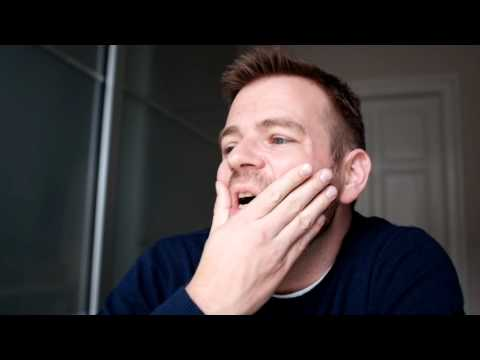

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo("Rwakh-HXPJk",width=800, height=450)

> *Reading*: NLPP Chapter 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.9, and 3.10\. It's not important that you go in depth with everything here - the key think is that you *know that Chapter 3 of this book exists*, and that it's a great place to return to if you're ever in need of an explanation of regular expressions, unicode, or other topics that you forget as soon as you stop using them (and don't worry, I forget about those things too).
> 

# Part 2: Community detection

Let's begin by watching a lecture to learn about communities. If you want all the details, I recommend you take a look at _Chapter 9_ in the _Network Science_ book ... but the video lecture below should be enough to get you started. 

**Note**: For this and the next exercise, work on the _undirected_ version of the network.

> **_Video Lecture_**: Communities in networks. 

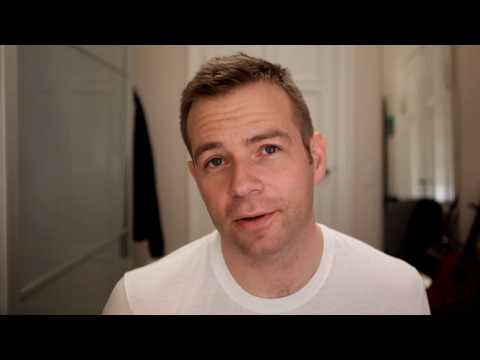

In [2]:
YouTubeVideo("FSRoqXw28RI",width=800, height=450)

# direct youtube link: https://www.youtube.com/watch?v=FSRoqXw28RI

Before we get started on *network* communities, we'll grab some information on a different kind of communities based on information from Wikipedia. Specifically, the ``infoboxes``. An infobox is the little box usually displayed on the right when you open an artist's page. 

For example if you open the page for [The Rolling Stones](https://en.wikipedia.org/wiki/The_Rolling_Stones), you'll see that it contains info about their place of ***origin***, the ***genre***s of music they've been associated with (in the case of the Stones it's `rock`, `pop` and `blues`), their ***year's active***, the record ***labels*** they've signed with over time, etc. All really interesting information if we want to understand the network of artists.

So let's start with an exercise designed to give you a sense of how good the LLMs are at the whole text-parsing thing.

*Exercise*: Go nuts with an LLM and get all the genres for the nodes in your network
> * Yes, I'm serious. For this one I'd like you to fire up your most powerful thinking model you have access to and get it to write a script to extract genre for all nodes in your network. Some notes to help you
>   * If the node doesn't have an `infobox` (or if a node's infobox doesn't have a `genre` it it), just don't assign that node a genre and ignore it in the downstream analysis
>   * Remember to lowercase all genres, also consider simplifying things by mapping `rock'n'roll`, `rock & roll`, etc to a single genre. 
>   * Remember to test your algorithm well before emplying it, since you're not writing the code yourself, you need to work harder to prove to yourself that it's actually doing what you think it's doing. You should inspect the code to understand what it's actually doing and also test it on the strangest edge-cases you can find. (Can it handle, "The Animals", for example).
>   * The output should be a dictionary mapping artist names to lists of genres (since most artists have multiple genres listed).
> * Report the following stats
>   * The number of nodes for which you could find genres
>   * The average number of genres per node
>   * The total number of distinct genres
>   * A histogram showing artist counts for the top 15 genres

<div class="alert alert-block alert-info">
LLMs all the way for this one. 
</div>

In [3]:
GRAPH_FILEPATH = "../data/rock/performers_graph.json"
PERFORMERS_DIR = "../data/rock/performers"
GENRES_FILEPATH = "artist_genres.json"

Processing 489 performer files...


100%|██████████| 489/489 [02:03<00:00,  3.95it/s]



Successfully extracted genres for 488 artists
No genres found for 1 artists

GENRE EXTRACTION STATISTICS
Number of nodes with genres: 488
Average number of genres per node: 3.98
Total number of distinct genres: 212

TOP 15 GENRES
 1. hard rock                       149 artists
 2. alternative rock                147 artists
 3. pop rock                        108 artists
 4. rock                             84 artists
 5. alternative metal                62 artists
 6. blues rock                       57 artists
 7. heavy metal                      52 artists
 8. pop                              51 artists
 9. post-grunge                      46 artists
10. soft rock                        45 artists
11. indie rock                       37 artists
12. progressive rock                 36 artists
13. new wave                         35 artists
14. folk rock                        34 artists
15. art rock                         32 artists


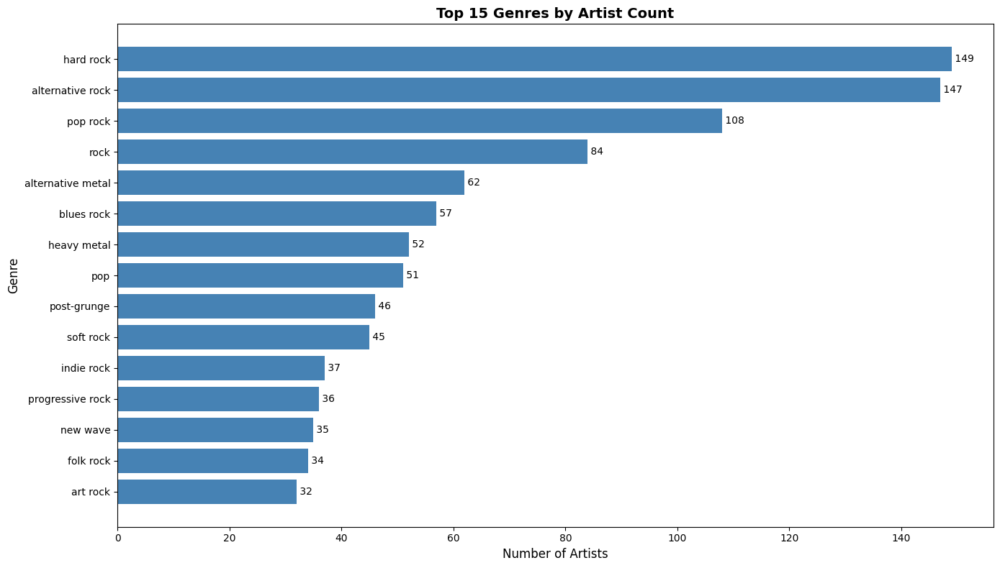

Artist-genre dictionary saved to: artist_genres.json
10 Years (band): alternative metal, progressive metal, post-grunge, nu metal
10cc: art rock, art pop, progressive pop, soft rock, pop rock
3 Doors Down: post-grunge, hard rock, alternative rock
311 (band): alternative rock, rap rock, reggae rock, funk rock, funk metal
38 Special (band): hard rock, southern rock, boogie rock, blues rock
A Perfect Circle: alternative rock, alternative metal, hard rock, art rock
ABBA: pop, disco, pop rock, europop
AC/DC: hard rock, blues rock, rock and roll, heavy metal
Accept (band): heavy metal
Adam Ant: new wave, post-punk, alternative rock, dance-rock


In [4]:
from lib.GenresExtractor import GenresExtractor

genres_extractor = GenresExtractor()

artist_genres = genres_extractor.extract_genres_from_performers(PERFORMERS_DIR)

genre_counts, top_15_genres = genres_extractor.analyze_genres(artist_genres)

genres_extractor.save_artist_genres(artist_genres, GENRES_FILEPATH)

example_artists = list(artist_genres.items())[:10]
for artist, genres in example_artists:
    print(f"{artist}: {', '.join(genres)}")

Now that we have the genres, let's use them - and see how community-like the community is, if we consider the genres to be community labels.


*Exercise*: Use the concept of modularity to explore how _community-like_ the genres are.
> 
> * Explain the concept of modularity in your own words.
> * Work from the undirected version of the network, keeping only the nodes for which you have genre information. 
> * Now create your own partition of the network into genres.
>      * **Each node is simply characterized by the *first genre* in its list of genres**.
>      * Each community is the group of nodes that share the same genre.
>      * That's all you need, now calculate the modularity of this division of the network into genres.
>      * **Note**: Modularity is described in the _Network Science_ book, section 9.4.. Thus, use **equation 9.12** in the book to calculate the modularity $M$ of the partition described above. Are the genres good communities?
> * Spoiling your findings a little bit, an issue is the following: Almost all artists have the genre `rock` as their first genre in the list, so by definition the network won't have very high modularity.
>      * What happens to the modularity if you grab the first genre *that's not `rock`* as the genre-assignment for all nodes that have more than one genre?
>      * What happens to the modularity if you use a random genre from the list genre as the node-lable for those nodes with more than one genre listed?
> * Discuss your findings. 

<div class="alert alert-block alert-info">
Overall, it's OK to use an LLM to help with the code here. But do write your own explanation of modularity, and do try to implement a modularity on your own from eq 9.12 in the book.
</div>

In [5]:
from lib.ModularityAnalyzer import ModularityAnalyzer
from lib.Loader import Loader

modularity_analyzer = ModularityAnalyzer()
loader = Loader()

G = loader.load_network(GRAPH_FILEPATH)
artist_genres = loader.load_artist_genres(GENRES_FILEPATH)

# Filter network to only nodes with genre information
G_filtered = modularity_analyzer.filter_network_by_genres(G, artist_genres)

# Filter artist_genres to only include nodes in the filtered graph
valid_artists = set(G_filtered.nodes())
artist_genres_filtered = {k: v for k, v in artist_genres.items() if k in valid_artists}

Loading network...
Network loaded: 489 nodes, 9600 edges
Loading genre data...
Genre data loaded for 488 artists


Filtered network: 488 nodes, 9241 edges
Nodes removed: 1


Modularity measures how well a network is divided into communities. It compares 
the actual number of edges within communities to the expected number if edges 
were randomly distributed while preserving node degrees.

According to equation 9.12 from the Network Science book:
$$M = \dfrac1{2L}\sum\left(A_{ij} - \dfrac{k_i\cdot k_j}{2L}\right)\delta(c_i, c_j)$$

Where:
- $M$ ranges from $-1$ to $1$
- $M > 0.3$ typically indicates significant community structure
- $M\approx 0$ suggests no better than random assignment
- $M < 0$ suggests anti-community structure (nodes in same group avoid each other)

Reference: http://networksciencebook.com/chapter/9

#### Strategy 1: First Genre Assignment

Each artist is assigned their FIRST genre from the list.

In [6]:
partition_first = modularity_analyzer.assign_genres_first(artist_genres_filtered)
modularity_analyzer.analyze_partition(partition_first)

modularity_first = modularity_analyzer.calculate_modularity(G_filtered, partition_first)
print(f"\n>>> MODULARITY (First Genre): {modularity_first:.4f}")

if modularity_first > 0.3:
    print("    Interpretation: Strong community structure")
elif modularity_first > 0:
    print("    Interpretation: Weak to moderate community structure")
else:
    print("    Interpretation: No meaningful community structure")

  Number of communities: 78
  Largest community: ('rock', 74)
  Top 10 communities:
     1. rock                             74 artists
     2. alternative rock                 65 artists
     3. hard rock                        50 artists
     4. pop rock                         20 artists
     5. heavy metal                      17 artists
     6. progressive rock                 16 artists
     7. rock and roll                    15 artists
     8. alternative metal                13 artists
     9. new wave                         12 artists
    10. post-grunge                      11 artists

>>> MODULARITY (First Genre): 0.0713
    Interpretation: Weak to moderate community structure


#### Strategy 2: First non-rock genre assignment

Each artist is assigned their FIRST NON-ROCK genre (if available). The reason is that since most artists have 'rock' as their first genre, this may reveal more specific genre communities.

In [7]:
partition_non_rock = modularity_analyzer.assign_genres_first_non_rock(artist_genres_filtered)
modularity_analyzer.analyze_partition(partition_non_rock)

modularity_non_rock = modularity_analyzer.calculate_modularity(G_filtered, partition_non_rock)
print(f"\n>>> MODULARITY (First Non-Rock Genre): {modularity_non_rock:.4f}")

if modularity_non_rock > 0.3:
    print("    Interpretation: Strong community structure")
elif modularity_non_rock > 0:
    print("    Interpretation: Weak to moderate community structure")
else:
    print("    Interpretation: No meaningful community structure")

  Number of communities: 111
  Largest community: ('heavy metal', 38)
  Top 10 communities:
     1. heavy metal                      38 artists
     2. pop                              35 artists
     3. rock                             28 artists
     4. alternative metal                27 artists
     5. post-grunge                      27 artists
     6. new wave                         18 artists
     7. pop-punk                         14 artists
     8. hard rock                        13 artists
     9. power pop                        12 artists
    10. glam metal                       12 artists

>>> MODULARITY (First Non-Rock Genre): 0.0611
    Interpretation: Weak to moderate community structure


#### Strategy 3: Random genre assignment

Each artist is assigned a RANDOM genre from their list. This provides a baseline and accounts for genre diversity.

In [8]:
partition_random = modularity_analyzer.assign_genres_random(artist_genres_filtered)
modularity_analyzer.analyze_partition(partition_random)

modularity_random = modularity_analyzer.calculate_modularity(G_filtered, partition_random)
print(f"\n>>> MODULARITY (Random Genre): {modularity_random:.4f}")

if modularity_random > 0.3:
    print("    Interpretation: Strong community structure")
elif modularity_random > 0:
    print("    Interpretation: Weak to moderate community structure")
else:
    print("    Interpretation: No meaningful community structure")

  Number of communities: 120
  Largest community: ('hard rock', 40)
  Top 10 communities:
     1. hard rock                        40 artists
     2. alternative rock                 30 artists
     3. pop rock                         25 artists
     4. rock                             25 artists
     5. blues rock                       18 artists
     6. soft rock                        17 artists
     7. alternative metal                16 artists
     8. heavy metal                      15 artists
     9. folk rock                        14 artists
    10. art rock                         11 artists

>>> MODULARITY (Random Genre): 0.0285
    Interpretation: Weak to moderate community structure


In [9]:
# Compare results
print("\n" + "="*70)
print("COMPARISON AND DISCUSSION")
print("="*70)

print(f"\n{'Strategy':<40} {'Modularity':>12}")
print("-"*55)
print(f"{'First Genre':<40} {modularity_first:>12.4f}")
print(f"{'First Non-Rock Genre':<40} {modularity_non_rock:>12.4f}")
print(f"{'Random Genre':<40} {modularity_random:>12.4f}")

print("\n" + "="*70)
print("KEY FINDINGS:")
print("="*70)

# Determine which is best
best_modularity = max(modularity_first, modularity_non_rock, modularity_random)

if best_modularity == modularity_first:
    best_strategy = "First Genre"
elif best_modularity == modularity_non_rock:
    best_strategy = "First Non-Rock Genre"
else:
    best_strategy = "Random Genre"

print(f"\n1. Best performing strategy: {best_strategy} (M = {best_modularity:.4f})")

improvement_non_rock = ((modularity_non_rock - modularity_first) / abs(modularity_first) * 100 
                        if modularity_first != 0 else float('inf'))
improvement_random = ((modularity_random - modularity_first) / abs(modularity_first) * 100 
                        if modularity_first != 0 else float('inf'))

print(f"\n2. Improvement from first genre to first non-rock: {improvement_non_rock:+.1f}%")
print(f"   Improvement from first genre to random: {improvement_random:+.1f}%")

print("\n3. Are genres good communities?")
if best_modularity > 0.3:
    print("   YES - Genres show strong community structure in the network.")
    print("   Artists within the same genre tend to be more connected than expected by chance.")
elif best_modularity > 0.1:
    print("   SOMEWHAT - Genres show weak to moderate community structure.")
    print("   There is some clustering by genre, but it's not very pronounced.")
else:
    print("   NO - Genres do not correspond well to network communities.")
    print("   The network structure doesn't align well with genre classifications.")

print("\n4. Interpretation:")
print("   - If modularity increased with non-rock genres: The 'rock' label is too")
print("     broad and masks more specific subgenre communities.")
print("   - If random assignment performed similarly: Multiple genres per artist")
print("     reflect the network's interconnected nature.")
print("   - Low modularity overall suggests: The network is formed by shared")
print("     influences/collaborations that cross genre boundaries.")

print("\n" + "="*70)
print("Analysis complete!")
print("="*70)

# Save results
results = {
    "network_stats": {
        "total_nodes": G_filtered.number_of_nodes(),
        "total_edges": G_filtered.number_of_edges()
    },
    "modularity_scores": {
        "first_genre": modularity_first,
        "first_non_rock_genre": modularity_non_rock,
        "random_genre": modularity_random
    },
    "best_strategy": best_strategy,
    "best_modularity": best_modularity
}

import json
filepath = "modularity_results.json"    
with open(filepath, 'w', encoding='utf-8') as f:
    json.dump(results, f, indent=2)

print(f"\nResults saved to: {filepath}")


COMPARISON AND DISCUSSION

Strategy                                   Modularity
-------------------------------------------------------
First Genre                                    0.0713
First Non-Rock Genre                           0.0611
Random Genre                                   0.0285

KEY FINDINGS:

1. Best performing strategy: First Genre (M = 0.0713)

2. Improvement from first genre to first non-rock: -14.4%
   Improvement from first genre to random: -60.0%

3. Are genres good communities?
   NO - Genres do not correspond well to network communities.
   The network structure doesn't align well with genre classifications.

4. Interpretation:
   - If modularity increased with non-rock genres: The 'rock' label is too
     broad and masks more specific subgenre communities.
   - If random assignment performed similarly: Multiple genres per artist
     reflect the network's interconnected nature.
   - Low modularity overall suggests: The network is formed by shared
     inf

*Exercise*: Community detection to find **structral communities** in the network
> * Again, work only with the subnetwork of nodes that have at least one genre.
> * Use [the Louvain-algorithm](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.community.louvain.louvain_communities.html) to find communities for the network. Report the value of modularity found by the algorithm. 
>     * **Note**: You can also try the *Infomap* algorithm instead if you're curious. Go to [this page]. (http://www.mapequation.org/code.html) and search for 'python'. It's harder to install, but a better community detection algorithm.
> * What is the modularity of this partitioning of the network? Is it more community-like than the genres? What does this comparison reveal about the communities?
> * Visualize the network, using the Force Atlas algorithm.
>     * This time assign each node a different color based on its structural _community_.
>     * **Note**: If there's a lot of small communities, it's OK to only color the 5-10 largest communities (you can make the remaing nodes light gray or some netural color)
>     * Describe the structure you observe.
> * Keep using the community labels from above, but now visualize only the backbone-edges from your favorite network backbone from last week. Do the community correspond to the backbone structure you detected?

<div class="alert alert-block alert-info">
It's OK to use an LLM to help with the code here. 
</div>

STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)
Loading network...
Network loaded: 489 nodes, 9600 edges
Loading genre data...
Genre data loaded for 488 artists


Filtered network: 488 nodes, 9241 edges

Detecting communities using Louvain algorithm...
Number of communities detected: 5
Largest community size: 158
Smallest community size: 44
Average community size: 97.6

Top 10 largest communities:
   1. Community   1:  158 nodes
   2. Community   0:  122 nodes
   3. Community   3:   90 nodes
   4. Community   2:   74 nodes
   5. Community   4:   44 nodes

Calculating modularity of detected communities...

MODULARITY OF STRUCTURAL COMMUNITIES: 0.2827
✓ MODERATE - Moderate community structure detected

COMPARISON WITH GENRE-BASED COMMUNITIES

Method                                     Modularity
-------------------------------------------------------
Structural (Louvain)                           0.2827
Genre - First Genre                            0.0713
Genre - First Non-Rock      

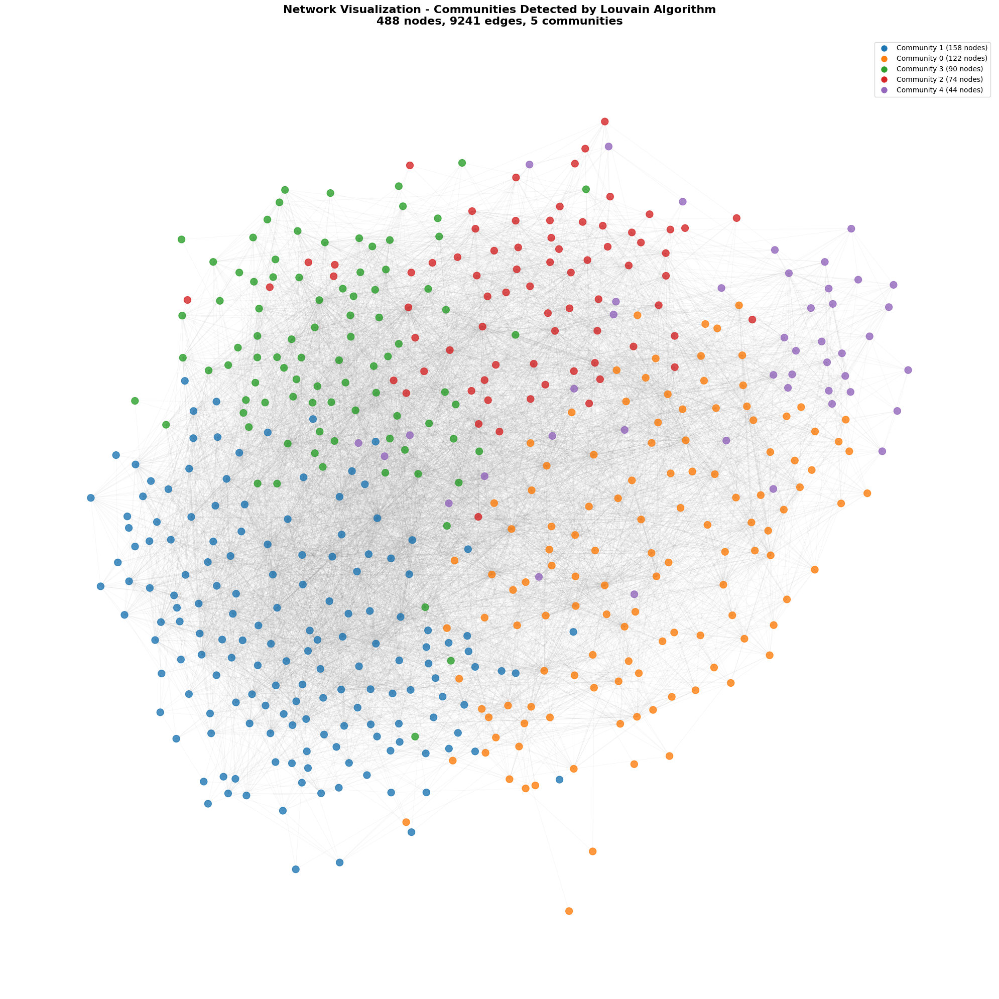


NETWORK STRUCTURE OBSERVATIONS

    Based on the visualization, consider:

    1. CLUSTERING: Are communities visibly clustered together or scattered?
    - Tight clusters suggest strong within-community connections
    - Scattered nodes suggest communities span different network regions

    2. BRIDGES: Are there visible "bridge" nodes connecting communities?
    - Bridge nodes may be artists that cross genre/style boundaries
    - High betweenness centrality nodes often appear as bridges

    3. CORE-PERIPHERY: Is there a dense core with sparse periphery?
    - Core nodes are likely influential/popular artists
    - Peripheral nodes may be niche or newer artists

    4. MODULARITY: Do the colored communities form distinct visual groups?
    - Clear separation validates high modularity scores
    - Overlapping colors suggest interconnected communities
    

Community results saved to: community_detection_results.json
Full partition saved to: community_detection_results_partition.json

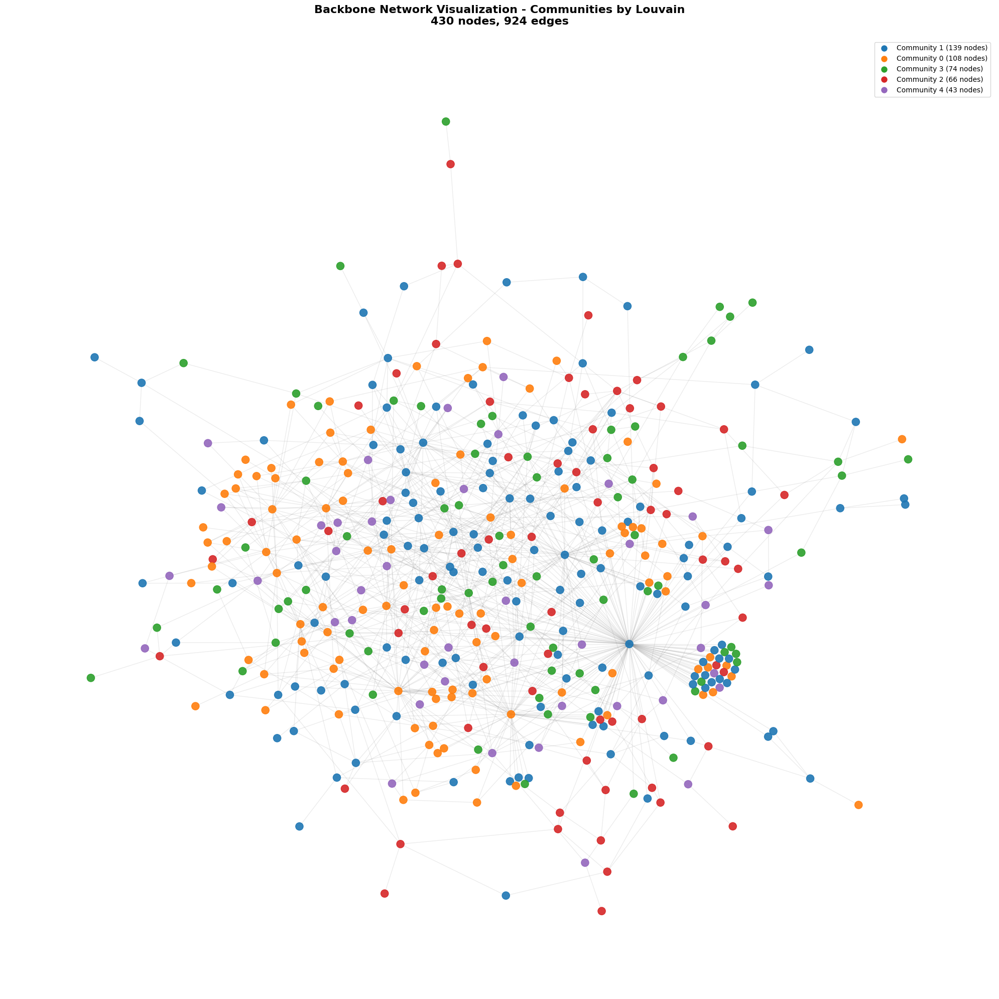


BACKBONE OBSERVATIONS

    The backbone network reveals the most important structural connections:

    1. COMMUNITY CORRESPONDENCE: Do the communities align with backbone structure?
    - If yes: Communities are defined by their connections to each other
    - If no: Communities may be based on dense internal connections

    2. HUB IDENTIFICATION: Which nodes remain central in the backbone?
    - These are the true "bridge" artists across the network
    - They connect different parts of the musical landscape

    3. STRUCTURAL CLARITY: Is the network structure clearer now?
    - Backbone removes noise and highlights key pathways
    - May reveal hierarchical or modular organization
    

ANALYSIS COMPLETE!

Files created:
1. community_detection_results.json - Community statistics
2. community_detection_results_partition.json - Full partition data
3. community_network_visualization.png - Full network with communities
4. backbone_communities_visualization.png - Backbone network (if g

In [10]:
from lib.CommunityDetector import CommunityDetector
import networkx as nx

community_detector = CommunityDetector()

print("="*70)
print("STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)")
print("="*70)

G = loader.load_network(GRAPH_FILEPATH)
artist_genres = loader.load_artist_genres(GENRES_FILEPATH)

# Filter to nodes with genres
G_filtered = community_detector.filter_network_by_genres(G, artist_genres)

# Make sure network is connected or work with largest component
if not nx.is_connected(G_filtered):
    print("\nNetwork is not fully connected. Working with largest connected component...")
    largest_cc = max(nx.connected_components(G_filtered), key=len)
    G_filtered = G_filtered.subgraph(largest_cc).copy()
    print(f"Largest component: {G_filtered.number_of_nodes()} nodes, {G_filtered.number_of_edges()} edges")

# Detect communities using Louvain
communities, partition = community_detector.detect_communities_louvain(G_filtered, seed=42)

# Calculate modularity
print("\nCalculating modularity of detected communities...")
structural_modularity = community_detector.calculate_modularity_networkx(G_filtered, partition)

print("\n" + "="*70)
print(f"MODULARITY OF STRUCTURAL COMMUNITIES: {structural_modularity:.4f}")
print("="*70)

if structural_modularity > 0.4:
    print("✓ EXCELLENT - Very strong community structure detected")
elif structural_modularity > 0.3:
    print("✓ GOOD - Strong community structure detected")
elif structural_modularity > 0.2:
    print("✓ MODERATE - Moderate community structure detected")
else:
    print("⚠ WEAK - Weak community structure detected")

# Compare with genre-based modularity
community_detector.compare_with_genre_modularity(structural_modularity)

# Visualize network
community_detector.visualize_communities(G_filtered, partition, 
                        output_file="community_network_visualization.png",
                        max_colored_communities=10)

# Save results
community_detector.save_community_results(G_filtered, communities, partition, structural_modularity,
                        "community_detection_results.json")

# Extract and visualize backbone
print("\n" + "="*70)
print("BACKBONE EXTRACTION AND VISUALIZATION")
print("="*70)
print("\nExtracting backbone edges to reveal core network structure...")
print("This removes less important edges and highlights key connections.")

# Try edge betweenness method
try:
    G_backbone = community_detector.extract_backbone_edges(G_filtered, 
                                        method='edge_betweenness', 
                                        alpha=0.1)
    
    # Visualize backbone with communities
    community_detector.visualize_backbone_communities(G_backbone, partition,
                                    output_file="backbone_communities_visualization.png",
                                    max_colored_communities=10)
except Exception as e:
    print(f"\nBackbone extraction skipped: {e}")
    print("For large networks, edge betweenness calculation can be slow.")
    print("You can run this separately if needed.")

print("\n" + "="*70)
print("ANALYSIS COMPLETE!")
print("="*70)
print("\nFiles created:")
print("1. community_detection_results.json - Community statistics")
print("2. community_detection_results_partition.json - Full partition data")
print("3. community_network_visualization.png - Full network with communities")
print("4. backbone_communities_visualization.png - Backbone network (if generated)")
print("\nNext steps:")
print("1. Examine the visualizations to understand network structure")
print("2. Compare structural communities with genre communities")
print("3. Run confusion matrix analysis (next exercise)")
print("4. Compare full network vs backbone structure")

Ok, now in this final community exercise, we want to check if the genres align with the communities.


> *Exercise*: Communities versus genres.
> * Compare the communities found by your algorithm with the music genres by creating a matrix $D$ with dimension ($G \times C$), where G is the 7 most common genres and C is the 7 most common communities. We set entry $D(i,j)$ to be the number of nodes that genre $i$ has in common with community $j$. The matrix $D$ is what we call a confusion matrix.
> * Use the confusion matrix to explain how well the communities you've detected correspond to the genres.
>     * **Note**: This time, use all the genres associate with each node
>     * **Note**: If a node is not characterized by any of the 7 most popular genres, just ignore it.
>     * **Note**: If a node is not part of by any of the 7 largest communiteis, just ignore it.

<div class="alert alert-block alert-info">
Again, you may use an LLM to help with the code for this assignment. The main thing is you get the D matrix right and interpret it.
</div>

Loading genre data...
Genre data loaded for 488 artists


NOTE: This script needs the full partition data from community_detection.py
Make sure you've run community_detection.py first.

Loading partition data...
Partition loaded for 488 artists

CREATING CONFUSION MATRIX

Top 7 genres:
  1. hard rock                      (149 occurrences)
  2. alternative rock               (147 occurrences)
  3. pop rock                       (108 occurrences)
  4. rock                           (84 occurrences)
  5. alternative metal              (62 occurrences)
  6. blues rock                     (57 occurrences)
  7. heavy metal                    (52 occurrences)

Top 7 communities:
  1. Community 1     (158 nodes)
  2. Community 0     (122 nodes)
  3. Community 3     (90 nodes)
  4. Community 2     (74 nodes)
  5. Community 4     (44 nodes)

Total artists included in confusion matrix: 402

VISUALIZING CONFUSION MATRIX

Confusion matrix saved to: confusion_matrix.png


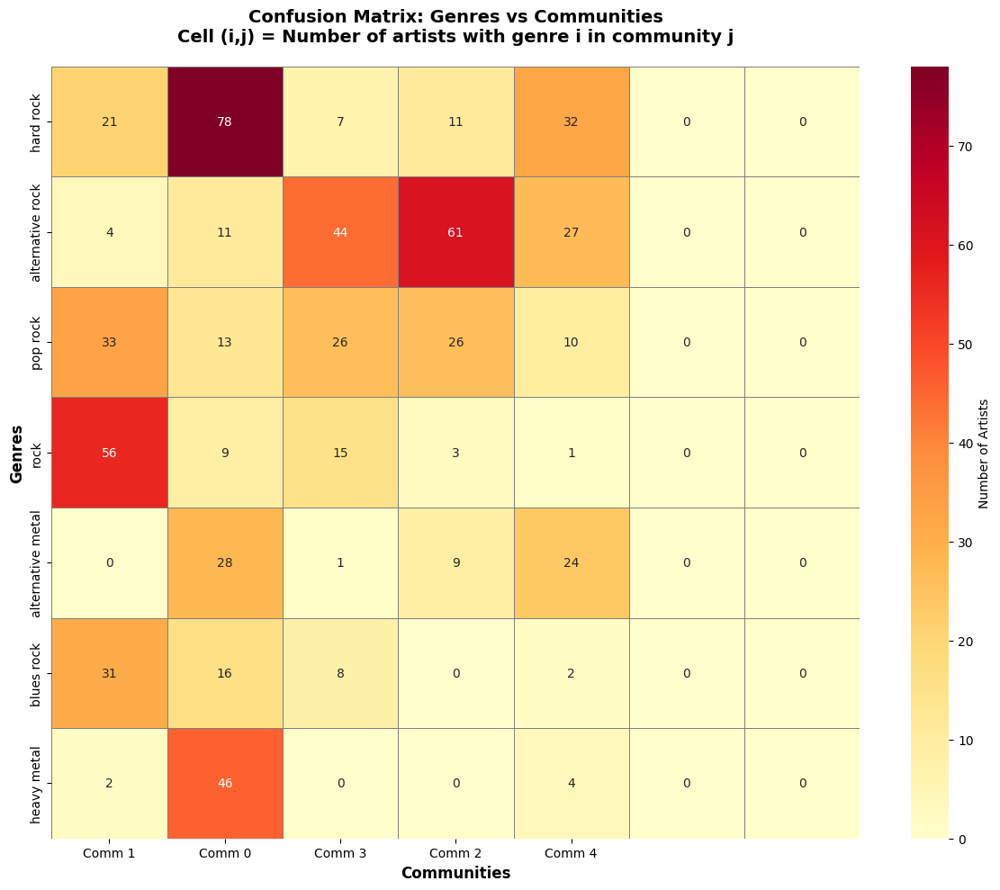


CONFUSION MATRIX ANALYSIS

Confusion Matrix D(genre, community):

                         Comm   1  Comm   0  Comm   3  Comm   2  Comm   4  
---------------------------------------------------------------------------
hard rock                     21       78        7       11       32  
alternative rock               4       11       44       61       27  
pop rock                      33       13       26       26       10  
rock                          56        9       15        3        1  
alternative metal              0       28        1        9       24  
blues rock                    31       16        8        0        2  
heavy metal                    2       46        0        0        4  

ROW ANALYSIS (Genre Distribution Across Communities)

hard rock:
  Total artists: 149
  Dominant community: Community 0 (78 artists, 52.3%)
  Distribution: C1:14% C0:52% C3:5% C2:7% C4:21% 

alternative rock:
  Total artists: 147
  Dominant community: Community 2 (61 artists, 41.5%)

In [11]:
from lib.ConfusionMatrixAnalyzer import ConfusionMatrixAnalyzer

confusion_matrix_analyzer = ConfusionMatrixAnalyzer()

community_file = "community_detection_results.json"
partition_file = "community_detection_results_partition.json"

artist_genres = loader.load_artist_genres(GENRES_FILEPATH)

# Load partition
print("\n" + "="*70)
print("NOTE: This script needs the full partition data from community_detection.py")
print("Make sure you've run community_detection.py first.")
print("="*70)

try:
    partition = confusion_matrix_analyzer.load_partition(partition_file)
except FileNotFoundError:
    print(f"\nError: Partition file not found at {partition_file}")
    print("Please run community_detection.py first to generate the partition.")
except Exception as e:
    print(f"\nError loading partition: {e}")

# Create confusion matrix
confusion_matrix, genre_labels, community_labels = confusion_matrix_analyzer.create_confusion_matrix(
    artist_genres, partition, top_n_genres=7, top_n_communities=7
)

# Visualize
confusion_matrix_analyzer.visualize_confusion_matrix(confusion_matrix, genre_labels, community_labels)

# Analyze
confusion_matrix_analyzer.analyze_confusion_matrix(confusion_matrix, genre_labels, community_labels)

# Save results
confusion_matrix_analyzer.save_confusion_matrix_results(confusion_matrix, genre_labels, community_labels)

# Part 3: Words that characterize pages or groups of pages

Now, we'll begin to play around with how far we can get with simple strategies for looking at text. 

The video is basically just me talking about a fun paper, which shows you how little is needed in order to reveal something highly interesting about humans that produce text. But it's important. Don't miss this one!

> **Video lecture**: Simple methods reveal a lot. I talk about the paper: [Personality, Gender, and Age in the Language of Social Media: The Open-Vocabulary Approach](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0073791).  

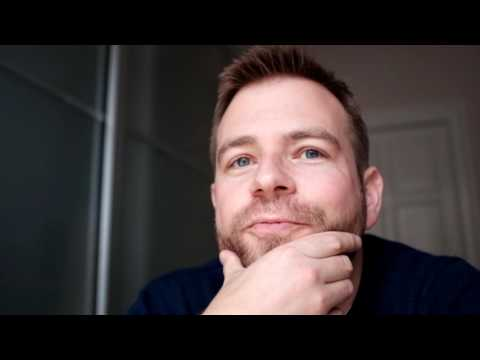

In [12]:
YouTubeVideo("wkYvdfkVmlI",width=800, height=450)

# direct youtube link: https://www.youtube.com/watch?v=wkYvdfkVmlI

_Exercise_: Comparing in the different genres. 

*Setup*. You'll need to go to your archives and find the wikipedia pages of all the rock artists. 

Once you have the texts ready, you will want to aggregate the text into 15 long lists, one for each of the top 15 genres (let's call them 15 *documents*). Each document contains on all the text in that genre (so for the rock genre it's a looooong big doc). In each list, you should keep all the words (or *tokens* to be more precise) that occur on the pages, and a count of how frequently each word occurs. So the format should be

```
word0 count0
word1 count1
word2 count2

...

wordN countN
```
This list is called a ***Term Frequency*** (or TF) list for each genre. Let's build our own TF lists. Before you start counting, I am going to ask you do do a few things

> *Action items*
> * Tokenize the pages into one long string per genre
> * Remove all punctuation from your list of tokens
> * Set everything to lower case
> * (Optional) Lemmatize your words
> * It's a good idea to filter out rare words (e.g. words that only appear less than 5 times).

If you are confused by the instructions for cleaning, go back and have a look at Chapter 3 again. You need to use the tools from the book to clean the text.

> *Action item*: 
> * Create your TF list for each of the 15 most popular genres.
> * List the top 15 words for each genre.
> * Comment on the top 15 words for each genre.

**Note**: Above you (once again) have to deal with the fact that many artists have multiple genres listed. Pick the method you like the best to deal with this. Some possible choices
* Counting each page multiple times, so a page counts once per genre that's listed
* Picking the first genre listed
* Picking the second genre listed
* Picking a random genre
* (... any other heuristic you like, e.g. using an api to ask an LLM to pick the genre that best describes the page from its list)

<div class="alert alert-block alert-info">
It's OK to use an LLM to help with the code here, but write your own comments.
</div>

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\longo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Loading genre data...
Genre data loaded for 488 artists

Identifying top 15 genres...
Top 15 genres:
   1. hard rock                      (149 occurrences)
   2. alternative rock               (147 occurrences)
   3. pop rock                       (108 occurrences)
   4. rock                           (84 occurrences)
   5. alternative metal              (62 occurrences)
   6. blues rock                     (57 occurrences)
   7. heavy metal                    (52 occurrences)
   8. pop                            (51 occurrences)
   9. post-grunge                    (46 occurrences)
  10. soft rock                      (45 occurrences)
  11. indie rock                     (37 occurrences)
  12. progressive rock               (36 occurrences)
  13. new wave                       (35 occurrences)
  14. folk rock                      (34 occurrences)
  15. art rock                       (32 occurrences)

PROCESSING MULTIPLE METHODS

This script will process the following genre assignment 

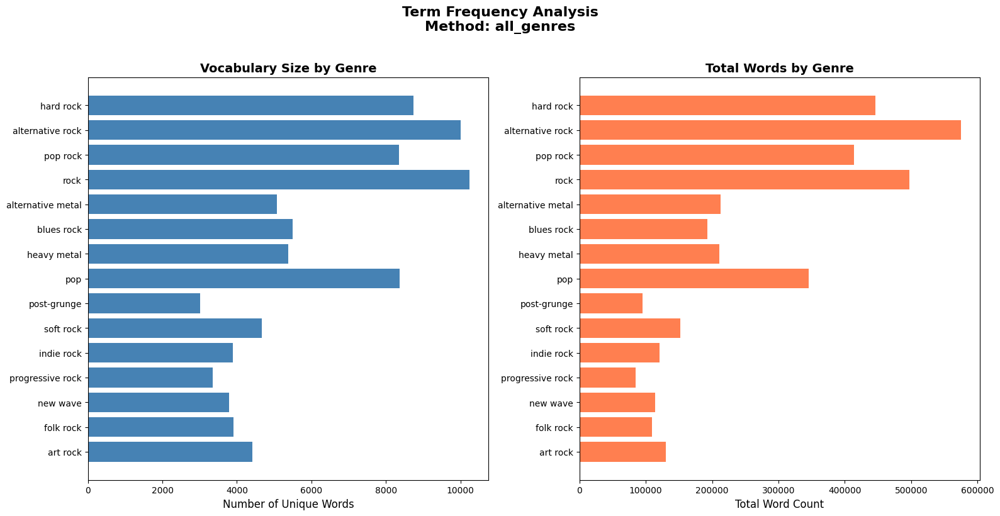


METHOD: FIRST_GENRE

AGGREGATING TEXT BY GENRE (Method: first_genre)
  Processed 50/488 artists...
  Processed 100/488 artists...
  Processed 150/488 artists...
  Processed 200/488 artists...
  Processed 250/488 artists...
  Processed 300/488 artists...
  Processed 350/488 artists...
  Processed 400/488 artists...

Processed 332 artists, skipped 116 (no text found)

Genre statistics:
  hard rock                        43 artists,   209384 tokens
  alternative rock                 70 artists,   360840 tokens
  pop rock                         21 artists,   115809 tokens
  rock                             67 artists,   510913 tokens
  alternative metal                21 artists,   131200 tokens
  blues rock                       25 artists,   115559 tokens
  heavy metal                      14 artists,    99457 tokens
  pop                              10 artists,    75308 tokens
  post-grunge                       8 artists,    25583 tokens
  soft rock                         6 artists

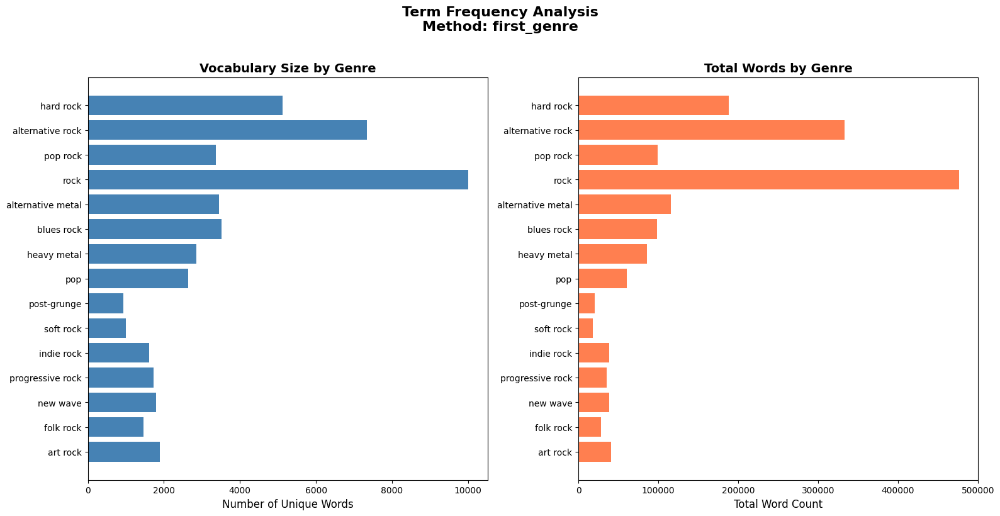


METHOD: FIRST_NON_ROCK

AGGREGATING TEXT BY GENRE (Method: first_non_rock)
  Processed 50/488 artists...
  Processed 100/488 artists...
  Processed 150/488 artists...
  Processed 200/488 artists...
  Processed 250/488 artists...
  Processed 300/488 artists...
  Processed 350/488 artists...
  Processed 400/488 artists...

Processed 332 artists, skipped 116 (no text found)

Genre statistics:
  hard rock                        20 artists,    78973 tokens
  alternative rock                 44 artists,   220997 tokens
  pop rock                         15 artists,    85311 tokens
  rock                             37 artists,   261422 tokens
  alternative metal                35 artists,   189430 tokens
  blues rock                       23 artists,   110128 tokens
  heavy metal                      29 artists,   208958 tokens
  pop                              45 artists,   376327 tokens
  post-grunge                      22 artists,    79258 tokens
  soft rock                         4 a

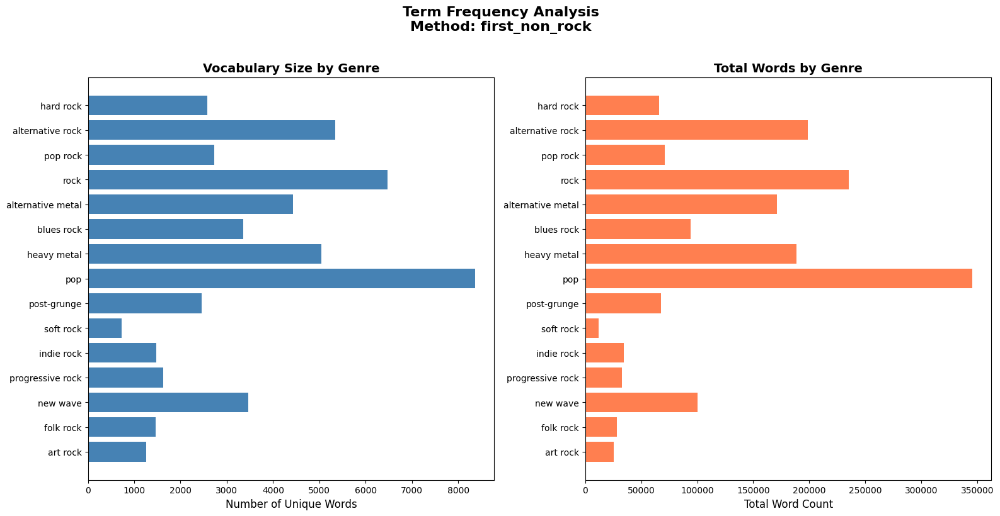


ANALYSIS COMPLETE

Generated files:

all_genres/
  - term_frequencies.json
  - tf_summary.png

first_genre/
  - term_frequencies.json
  - tf_summary.png

first_non_rock/
  - term_frequencies.json
  - tf_summary.png


In [13]:
from lib.TermFrequencyAnalyzer import TermFrequencyAnalyzer, GenreAssignmentMethod
import random
import os

term_frequency_analyzer = TermFrequencyAnalyzer()

# Configuration
n_top_genres = 15
min_word_freq = 5
lemmatize = False  # Set to True for lemmatization

# Load data
artist_genres = loader.load_artist_genres(GENRES_FILEPATH)
top_genres = term_frequency_analyzer.get_top_genres(artist_genres, n=n_top_genres)

# Genre assignment methods to try
methods = [
    (GenreAssignmentMethod.ALL_GENRES, "all_genres"),
    (GenreAssignmentMethod.FIRST_GENRE, "first_genre"),
    (GenreAssignmentMethod.FIRST_NON_ROCK, "first_non_rock"),
]

print("\n" + "="*70)
print("PROCESSING MULTIPLE METHODS")
print("="*70)
print("\nThis script will process the following genre assignment methods:")
for i, (method, name) in enumerate(methods, 1):
    print(f"  {i}. {name}: ", end="")
    if method == GenreAssignmentMethod.ALL_GENRES:
        print("Count each page for every genre it has")
    elif method == GenreAssignmentMethod.FIRST_GENRE:
        print("Use only the first genre")
    elif method == GenreAssignmentMethod.FIRST_NON_ROCK:
        print("Use first non-rock genre (or first if all rock)")

# Process each method
results = {}

for method, method_name in methods:
    print("\n" + "="*70)
    print(f"METHOD: {method_name.upper()}")
    print("="*70)
    
    # Set random seed for reproducibility (for random method)
    if method == GenreAssignmentMethod.RANDOM_GENRE:
        random.seed(42)
    
    # Aggregate and analyze
    genre_tf = term_frequency_analyzer.aggregate_text_by_genre(
        artist_genres, 
        PERFORMERS_DIR, 
        top_genres,
        method=method,
        lemmatize=lemmatize,
        min_word_freq=min_word_freq
    )
    
    # Display results
    term_frequency_analyzer.display_top_words(genre_tf, n=15)
    
    # Save results
    output_dir = f"tf_analysis_{method_name}"
    os.makedirs(output_dir, exist_ok=True)
    
    tf_file = f"{output_dir}/term_frequencies.json"
    term_frequency_analyzer.save_term_frequencies(genre_tf, tf_file)
    
    summary_file = f"{output_dir}/tf_summary.png"
    term_frequency_analyzer.create_tf_summary(genre_tf, top_genres, method_name, summary_file)
    
    results[method_name] = genre_tf

# Final summary
print("\n" + "="*70)
print("ANALYSIS COMPLETE")
print("="*70)
print("\nGenerated files:")
for method, _ in methods:
    method_name = method if isinstance(method, str) else method
    print(f"\n{method_name}/")
    print(f"  - term_frequencies.json")
    print(f"  - tf_summary.png")

#### Observations and next steps

1. COMMON WORDS: Notice that top words are often generic (band, music, album, etc.)
- This is expected without TF-IDF weighting
- These words don't distinguish between genres

2. METHOD COMPARISON:
- ALL_GENRES: Most comprehensive, includes all artist-genre associations
- FIRST_GENRE: Cleaner, but may be dominated by 'rock'
- FIRST_NON_ROCK: Tries to capture genre-specific terms

3. NEXT STEPS:
- Part 4: Create word clouds for visualization
- Part 5: Learn about TF-IDF to extract characteristic words
- Part 6: Apply TF-IDF to find genre-specific vocabulary

The current TF analysis shows word frequency, but doesn't highlight what makes
each genre UNIQUE. That's where TF-IDF comes in!

# Part 4: Visualization

**Step 1: Install the software**

First you must set up your system. The most difficult thing about creating the wordcloud is installing the `WordCloud` module. It's available on GitHub, check out the page [**here**](https://github.com/amueller/word_cloud). 

You should be able to simply install using conda (and all dependencies, etc will be automatically fixed): 

    conda install -c conda-forge wordcloud
 
If you can't get that to work, there is more info on the GitHub page
 * On my system, the module needed the `gcc` compiler installed. If you're not already a programmer, you may have to install that. On Mac you get it by installing the [_command line tools_](http://osxdaily.com/2014/02/12/install-command-line-tools-mac-os-x/). On linux, it's probably already installed. And on Windows I'm not sure, but we'll figure it out during the exercises. 
 * Once that's all set up, you can use `pip` to install the `WordCloud` library, as [detailed on the GitHub page](https://github.com/amueller/word_cloud). But don't forget to use Anaconda's `pip`.
 * There are examples of how to use the module online, see [this page](http://sebastianraschka.com/Articles/2014_twitter_wordcloud.html) for a nice example. If you're interested, you can read about how the package was put together - and how it works [here](http://peekaboo-vision.blogspot.dk/2012/11/a-wordcloud-in-python.html). 

**Step 2: Draw some wordclouds**

> *Action items*
> * Get your lists ready for the word-cloud software
>    - The package needs a single string to work on. The way that I converted my lists to a string was to simply combine all words together in one long string (separated by spaces), repeating each word according to its count. 
>    - The `wordcloud` package looks for collocations in real texts, which is a problem when you make the list as above. The recommended fix is to simply set `collocations = False` as an option when you run the package.
> * Now, create a word-cloud for each genre. Feel free to make it as fancy or non-fancy as you like. Comment on the results. (If you'd like, you can remove stopwords and wiki-syntax - I did a bit of that for my own wordclouds.)

<div class="alert alert-block alert-info">
As above, it's OK to use an LLM to help get the code going. But write your own answers to the questions.
</div>


Available TF analysis methods:
  1. all_genres
  2. first_genre
  3. first_non_rock

Using method: all_genres
(You can change 'selected_method' in the script to try other methods)

Loading term frequencies from tf_analysis_all_genres/term_frequencies.json...
Loaded TF data for 15 genres

CREATING INDIVIDUAL WORD CLOUDS
Creating word cloud 1/15: hard rock
  Saved to tf_analysis_all_genres/wordclouds\hard_rock_wordcloud.png
Creating word cloud 2/15: alternative rock
  Saved to tf_analysis_all_genres/wordclouds\alternative_rock_wordcloud.png
Creating word cloud 3/15: pop rock
  Saved to tf_analysis_all_genres/wordclouds\pop_rock_wordcloud.png
Creating word cloud 4/15: rock
  Saved to tf_analysis_all_genres/wordclouds\rock_wordcloud.png
Creating word cloud 5/15: alternative metal
  Saved to tf_analysis_all_genres/wordclouds\alternative_metal_wordcloud.png
Creating word cloud 6/15: blues rock
  Saved to tf_analysis_all_genres/wordclouds\blues_rock_wordcloud.png
Creating word cloud 7/15: he

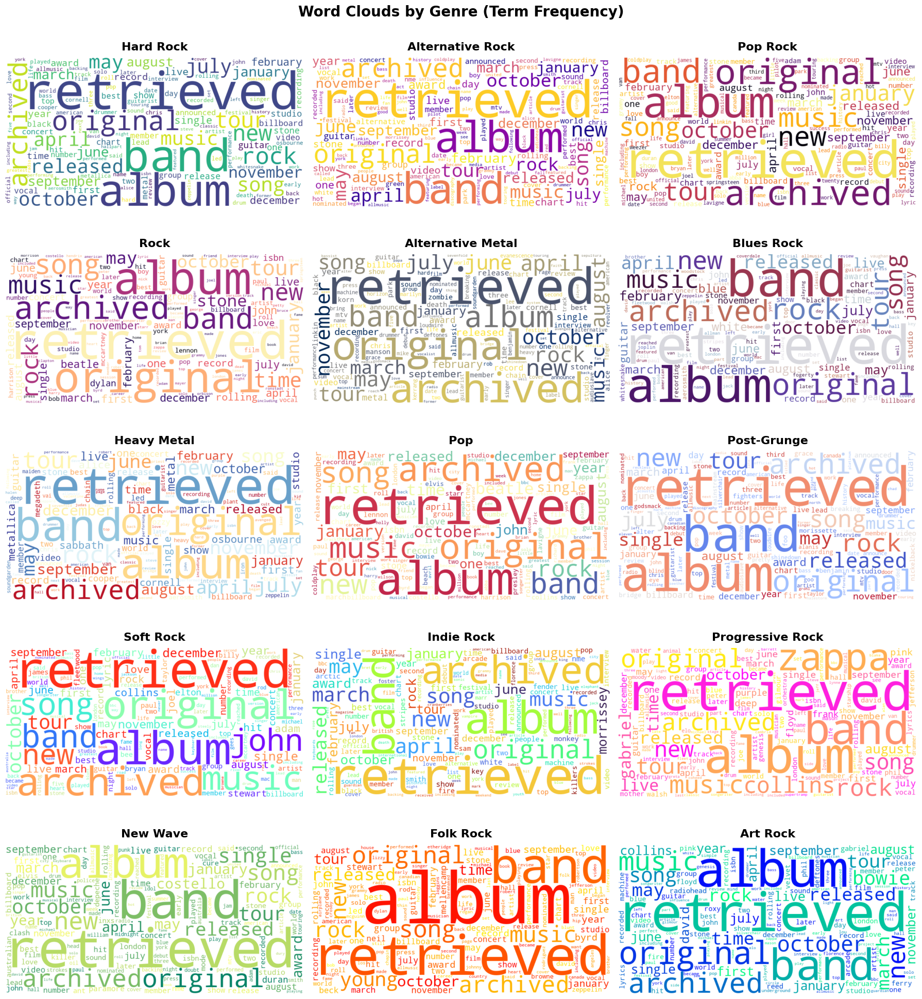


WORD CLOUD ANALYSIS

Top 5 words per genre:
----------------------------------------------------------------------
Hard Rock                      retrieved (9820), band (6950), album (5968), original (5843), archived (5535)
Alternative Rock               retrieved (14273), original (9256), archived (9253), band (9111), album (8322)
Pop Rock                       retrieved (9190), original (6606), archived (6443), album (5553), band (5463)
Rock                           retrieved (7397), original (5223), archived (4944), album (4527), band (3977)
Alternative Metal              retrieved (6230), original (4084), archived (4025), band (3567), album (3425)
Blues Rock                     retrieved (3504), band (2988), album (2238), original (1965), archived (1849)
Heavy Metal                    retrieved (4908), band (3426), original (3001), archived (2856), album (2807)
Pop                            retrieved (5209), original (3773), archived (3633), album (3143), music (2629)
Post-Grung

In [14]:
from lib.WordcloudGenerator import WordcloudGenerator

wordcloud_generator = WordcloudGenerator()

# Configuration
print("\nAvailable TF analysis methods:")
methods = [
    GenreAssignmentMethod.ALL_GENRES, 
    GenreAssignmentMethod.FIRST_GENRE, 
    GenreAssignmentMethod.FIRST_NON_ROCK
]
for i, method in enumerate(methods, 1):
    print(f"  {i}. {method}")

# You can change this to use a different method
selected_method = GenreAssignmentMethod.ALL_GENRES  # Change to 'first_genre' or 'first_non_rock' if desired

print(f"\nUsing method: {selected_method}")
print("(You can change 'selected_method' in the script to try other methods)\n")

# Paths
tf_dir = f"tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"

# Check if file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

# Load TF data
genre_tf = loader.load_term_frequencies(tf_file)

# Create output directory
wordcloud_dir = f"{tf_dir}/wordclouds"

# Create individual word clouds
wordcloud_generator.save_individual_wordclouds(genre_tf, wordcloud_dir, colormap='viridis')

# Create combined grid
combined_file = f"{wordcloud_dir}/all_genres_combined.png"
wordcloud_generator.create_combined_wordcloud_grid(genre_tf, combined_file, n_cols=3)

# Analysis
wordcloud_generator.analyze_wordcloud_results(genre_tf)

print("\n" + "="*70)
print("WORD CLOUD GENERATION COMPLETE!")
print("="*70)
print(f"\nGenerated files in {wordcloud_dir}/:")
print("  - Individual word cloud for each genre (PNG)")
print("  - all_genres_combined.png (grid view)")
print("\nYou can now:")
print("  1. Examine the word clouds to see term frequencies")
print("  2. Note the generic words that dominate")
print("  3. Proceed to Part 5 (TF-IDF) to fix this limitation")
print("  4. Try other methods by changing 'selected_method' in the script")

# Part 5: Understanding TF-IDF

Now we jump back into the NLP work. In this last part, we'll be creating word-clouds again. But this time, we'll be using the method from the paper I discuss above: TF-IDF. Historically people have had a hard time grasping the idea behind TF-IDF, so here's a little exercise designed to make you study it a bit more carefully.

*Exercise 4*: Wrap your brain around TF-IDF

First, let's learn about TF-IDF the way wikipedia explains it. Check out [the wikipedia page for TF-IDF](https://en.wikipedia.org/wiki/Tf%E2%80%93idf) and ***read the first part very carefully***. The idea is that the term frequency doesn't capture just what's special about a text. It also only captures words that are just frequent in all text. 

This is clear from the top counts in one of my lists:

```
of 
in 
and 
the 
to 
a 
is
by
was
as
ref
with
first
 ```
 
You can fix some of this by removing stop-words (as is described in the book), but it's not enough. ***We want to pull out what's special about a particular text.*** 

To focus on just what's special, TF-IDF has two components: The *term frequency* (TF) and a *weight* (IDF). The weight draws on a larger corpus of text emphasize what's special about the text we're interested in.

Further, there are some extra things going on. For example, there are multiple definitions of TF on wikipedia. Above, we just looked at the raw counts.

> *Action item*
>   * Pick one of the alternative term frequency definitions. Explain why it might sometimes be prefereable to the raw count.

Now, let's talk about the inverse document frequency.

> *Action item*
>   * What does IDF stand for? Answer in your own words.
>   * How does IDF draw on a larger corpus to extract what's special a certain text? Answer in your own words.

There are also multiple versions of IDF. Let's think about those for a moment.

> *Action items*
>   * All of the IDF versions take the log of the calculated weight. Why do you think that is?
>   * Explain why using IDF makes stopword removal less important.

<div class="alert alert-block alert-info">
The point of this exercise is to understand TF-IDF. So if there are parts of the wikipedia page you don't understand, I encourage you to ask questions to an LLM to really understand the concept. Perhaps ask it to explain TF-IDF at the level of a high-school student. Once you've done that, then answer the questions in the action items on your own.
</div>

# Part 6: Genres and TF-IDF word-clouds

**But wait a minute!** Now we have all of the ingredients for a wonderful cocktail 😎

* We have genres - descriptions of related nodes in the network. 
* And you're an expert on TF-IDF, so you can extract words that characterize a text relative to everything that's going on.
* Finally, you can create nice WordCouds!

So let's put it all together. Let's use TF-IDF and wordcoulds to build a deeper understanding of the top communities.

Thus, the aim of this final part is to create genre wordclouds for the top 15 genres based on TF-IDF. 

For each genre, create a single document for each community consisting of all the cleaned text from all members of the community. So in the end, you should have 15 documents in total.

_Exercise_: Genre Word-clouds

> * Now that we have the community-texts, let's start by grabbing the TF lists from the exercise above (you may modify to use whichever version of TF you like). 
> * Next, calculate IDF for every word in every list (use whichever version of IDF you like). 
>   * Which base logarithm did you use? Is that important?
> * We're now ready to calculate TF-IDFs. Do that for each genre. 
>   * List the 10 top words for each genre accourding to TF-IDF. Are these 10 words more descriptive of the genre than just the TF? Justify your answer.
> * Create a wordcloud for each genre.
>     * **Note**: you may have to rescale the TF-IDF weights so they make sense to the wordcloud package. Write about this issue and how you solve it.
> * Explain your creation. Do the wordclouds/TF-IDF lists enable you to understand the communities you have found (or is it just gibberish)? Justify your answer.

<div class="alert alert-block alert-info">
Overall, it's OK to use an LLM to help with the code. But do write your own answers to the questions.
</div>

TF-IDF (Term Frequency - Inverse Document Frequency) Overview:

TF-IDF identifies words that are CHARACTERISTIC of a document by balancing:
1. TF: How often a word appears in THIS document (frequency)
2. IDF: How rare the word is ACROSS ALL documents (specificity)

Result: High TF-IDF = frequent in this genre, rare in others = CHARACTERISTIC!

This fixes the problem from Part 4 where generic words (band, album, music)
dominated all genre word clouds.

Using TF analysis method: all_genres
Loading term frequencies from tf_analysis_all_genres/term_frequencies.json...
Loaded TF data for 15 genres

Initialized TF-IDF Analyzer:
  - 15 documents (genres)
  - 16204 unique words in vocabulary

Calculating IDF scores (log base: e)...
IDF calculation complete!
  - Min IDF: 0.0000 (common words)
  - Max IDF: 2.7081 (rare words)

Calculating TF-IDF scores (TF variant: log)...
TF-IDF calculation complete!

TF vs TF-IDF COMPARISON

HARD ROCK
----------------------------------------------------------------------
TOP BY TF (Frequency)                    TOP BY TF-IDF (Importance)
Word                           Count  Word                           Score
----------------------------------------------------------------------
retrieved                       9820  chisel                       15.0685
band                            6950  holder                       14.1742
album                           5968  lea                          13.4082
origi

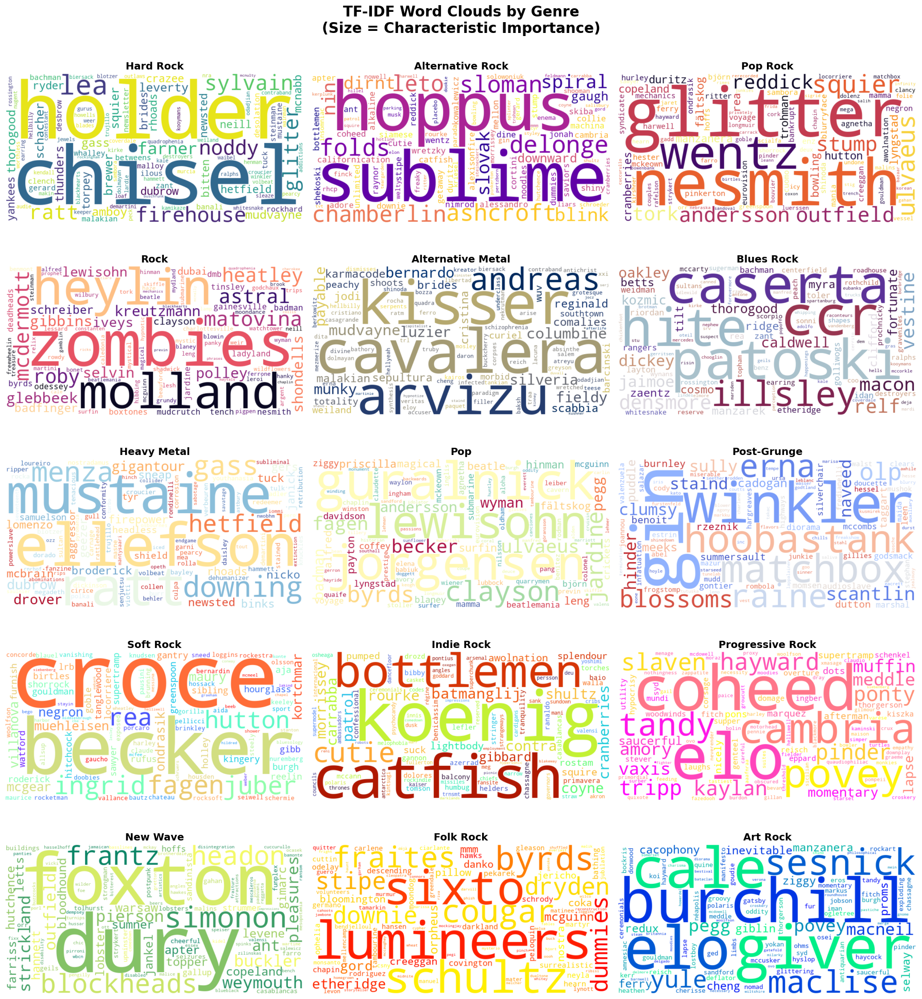


Generated files in tf_analysis_all_genres/tfidf_analysis/:
  - tfidf_scores.json - TF-IDF scores for all words
  - idf_scores.json - IDF scores for vocabulary
  - top_tfidf_words.json - Top 20 words per genre
  - wordclouds/ - Individual and combined word clouds


In [15]:
from lib.TFIDFAnalyzer import TFIDFAnalyzer

# Configuration
selected_method = GenreAssignmentMethod.ALL_GENRES

print(f"Using TF analysis method: {selected_method}")

# Paths
tf_dir = f"tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"
output_dir = f"{tf_dir}/tfidf_analysis"

# Check if TF file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

# Load TF data
genre_tf = loader.load_term_frequencies(tf_file)

# Initialize TF-IDF analyzer
analyzer = TFIDFAnalyzer(genre_tf)

# Calculate IDF
idf_scores = analyzer.calculate_idf(log_base='e')  # Natural logarithm

# Calculate TF-IDF
genre_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')  # 1 + log(TF)

# Display comparison
analyzer.display_comparison(genre_tfidf, n=10)

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Save results
analyzer.save_tfidf_results(genre_tfidf, idf_scores, output_dir)

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(genre_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_genres_tfidf_combined.png')
analyzer.create_combined_tfidf_grid(genre_tfidf, combined_file, n_cols=3)

# Final summary
print(f"\nGenerated files in {output_dir}/:")
print("  - tfidf_scores.json - TF-IDF scores for all words")
print("  - idf_scores.json - IDF scores for vocabulary")
print("  - top_tfidf_words.json - Top 20 words per genre")
print("  - wordclouds/ - Individual and combined word clouds")

Compare the TF-IDF word clouds with the TF word clouds from Part 4:

TF WORD CLOUDS (Part 4):
- Dominated by generic words: band, album, music, song
- Similar across all genres
- Shows what's FREQUENT but not CHARACTERISTIC

TF-IDF WORD CLOUDS (Part 6):
- Shows genre-specific vocabulary
- Different for each genre
- Reveals what makes each genre UNIQUE
- Generic words are downweighted

INTERPRETATION QUESTIONS TO ANSWER:
1. Are the TF-IDF top 10 words more descriptive than TF top 10? YES!
2. Do TF-IDF word clouds help understand genres? Examine them!
3. Do you see genre-specific terms (e.g., specific artist names, 
subgenre terms, cultural references)?
4. How did rescaling work? We normalized TF-IDF to [1,100] range

NEXT: Optional - Apply same analysis to structural communities!

*Exercise*: Community Word-clouds
> * Redo the exercise above but for the 15 largest structural communities.
> * Do the word clouds seem more meaningful than for the genres? Optional: Add nuance to your answer by considering the confusion matrix $D$ that you calculated above.

Note that this is a great way of characterizing the structural communities if you don't have genre-labels (or other labels for that matter).

<div class="alert alert-block alert-info">
Todays exercices are getting, long and involved so you can do whatever parts of this one that you like with LLMs. Maybe you can even get one to solve the whole exercise?
</div>

This script applies TF-IDF analysis to structural communities instead of genres.

Process:
1. Load community partition from Louvain algorithm
2. Extract text for all artists
3. Aggregate text for each community (all members' texts combined)
4. Calculate TF-IDF for communities
5. Create word clouds to characterize communities by their vocabulary

This helps answer: What are these communities about?

Loading community partition from community_detection_results_partition.json...
Loaded partition with 488 artists

Extracting texts from performer JSON files...
  Processed 100/489 files...
  Processed 200/489 files...
  Processed 300/489 files...
  Processed 400/489 files...
Extracted texts for 489 artists

Creating documents for top 15 communities...

Top Communities by Size:
  Community 1: 158 artists
  Community 0: 122 artists
  Community 3: 90 artists
  Community 2: 74 artists
  Community 4: 44 artists
  Community 1: Aggregated 126/158 texts (1380959 words)
  Community 0: Aggregated 80/122 texts (837886 words)
  Community 3: Aggregated 73/90 texts (739373 words)
  Community 2: Aggregated 53/74 texts (527646 words)
  Community 4: Aggregated 33/44 texts (210585 words)

Created 5 community documents

Computing term frequencies for communities...
  Processing Community_1...
    784595 tokens → 13641 unique words (min_count=5)
  Processing Community_0...
    452624 tokens → 9053 unique 

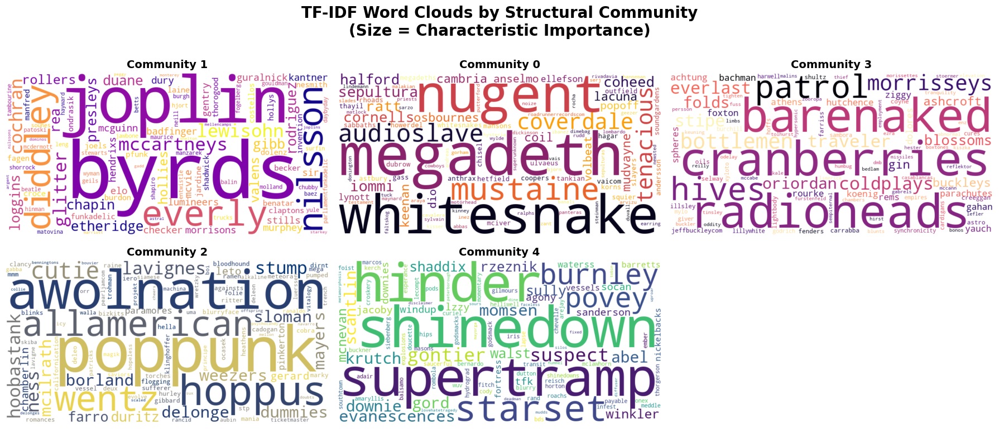


Generated files in tfidf_communities/:
  - community_tfidf_scores.json - TF-IDF scores for all communities
  - community_idf_scores.json - IDF scores across communities
  - top_community_tfidf_words.json - Top 20 words per community
  - wordclouds/ - Individual and combined word clouds


In [17]:
from lib.TFIDFCommunities import TFIDFCommunities

communities_generator = TFIDFCommunities()

# Paths
partition_file = "community_detection_results_partition.json"
output_dir = "tfidf_communities"

# Load partition
print(f"Loading community partition from {partition_file}...")
with open(partition_file, 'r', encoding='utf-8') as f:
    partition = json.load(f)
print(f"Loaded partition with {len(partition)} artists\n")

# Extract texts
artist_texts = communities_generator.extract_texts_from_performers(PERFORMERS_DIR)

if not artist_texts:
    print("ERROR: No texts extracted!")

# Create community documents
community_docs = communities_generator.create_community_documents(artist_texts, partition, top_n=15)

# Compute TF
community_tf = communities_generator.compute_community_tf(community_docs, min_count=5)

# Calculate IDF and TF-IDF
analyzer = TFIDFAnalyzer(community_tf)
idf_scores = analyzer.calculate_idf(log_base='e')
community_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')

# Display comparison
analyzer.display_comparison(community_tfidf, n=10)

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Save TF-IDF scores
tfidf_file = os.path.join(output_dir, 'community_tfidf_scores.json')
with open(tfidf_file, 'w', encoding='utf-8') as f:
    json.dump(community_tfidf, f, indent=2, ensure_ascii=False)
print(f"\nCommunity TF-IDF scores saved to {tfidf_file}")

# Save IDF scores
idf_file = os.path.join(output_dir, 'community_idf_scores.json')
with open(idf_file, 'w', encoding='utf-8') as f:
    json.dump(idf_scores, f, indent=2, ensure_ascii=False)
print(f"Community IDF scores saved to {idf_file}")

# Save top words
top_words = {}
for comm_name, tfidf_dict in community_tfidf.items():
    sorted_words = sorted(tfidf_dict.items(), 
                            key=lambda x: x[1], 
                            reverse=True)[:20]
    top_words[comm_name] = [{"word": w, "score": float(s)} for w, s in sorted_words]

top_file = os.path.join(output_dir, 'top_community_tfidf_words.json')
with open(top_file, 'w', encoding='utf-8') as f:
    json.dump(top_words, f, indent=2, ensure_ascii=False)
print(f"Top community TF-IDF words saved to {top_file}")

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(community_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_communities_tfidf_combined.png')
communities_generator.create_combined_community_grid(community_tfidf, combined_file, n_cols=3)

# Final summary
print(f"\nGenerated files in {output_dir}/:")
print("  - community_tfidf_scores.json - TF-IDF scores for all communities")
print("  - community_idf_scores.json - IDF scores across communities")
print("  - top_community_tfidf_words.json - Top 20 words per community")
print("  - wordclouds/ - Individual and combined word clouds")

Compare community word clouds with genre word clouds:

QUESTIONS TO CONSIDER:
1. Are community word clouds more or less meaningful than genre word clouds?
2. Can you identify what makes each community distinct from its vocabulary?
3. Look at the confusion matrix from Part 2:
- Do communities with high genre purity show genre-specific vocabulary?
- Do mixed communities show vocabulary from multiple genres?
4. Which approach better characterizes the network structure:
- Genre labels (external metadata)?
- Community detection + TF-IDF (data-driven)?

This demonstrates how TF-IDF can characterize structural communities
when you DON'T have genre labels!